# RTE 7000 test

In this example, we showcase the synthesization of the newly released [RTE dataset](https://huggingface.co/datasets/OpenSynth/D-GITT-RTE7000-2021), which contains snaps of the French electric grid. Here, we use one snapshot of the powsybl-compitable data source file. 

In [ ]:
# ── Colab-only setup (run once, then restart the runtime) ──
# Colab pre-loads NumPy's C extensions into memory. Installing pandapower may
# upgrade NumPy, but the old .so files stay loaded and cause ImportError.
# Pinning versions + restarting the runtime fixes this.
%pip install -q "numpy>=2.2,<3" "scipy>=1.15,<2" "pandapower>=3.3,<4" "pypowsybl>=1.14,<2" "pypowsybl-jupyter>=1.0"
%pip install -q git+https://github.com/TU-Delft-AI-Energy-Lab/grid-synthesizer.git@main

# Restart the Colab runtime so the new NumPy C extensions are loaded.
# After the restart, skip this cell and run the next one.
import IPython
IPython.Application.instance().kernel.do_shutdown(True)


In [ ]:
import os 
import networkx as nx
import pypowsybl as ppl
from collections import Counter

from powergrid_synth import (
    PowerGridGenerator,
    BusTypeAllocator,
    GraphComparator,
    CapacityAllocator,
    LoadAllocator,
    GenerationDispatcher,
    TransmissionLineAllocator,
    pandapower_to_nx,
    nx_to_pandapower,
    extract_topology_params_from_graph,
)

# Load the data from source file

get the data file and store it in `data/`

In [ ]:
!mkdir -p data

!wget -O data/future_snapshot.xiidm.bz2 https://raw.githubusercontent.com/TU-Delft-AI-Energy-Lab/grid-synthesizer/main/examples/transmission/data/future_snapshot.xiidm.bz2

!ls data/

In [3]:
grid = ppl.network.load(file='data/future_snapshot.xiidm.bz2')
print('Grid model loaded')

Grid model loaded


In [4]:
nsubstations = len(grid.get_substations())
nvoltage_levels = len(grid.get_voltage_levels())
nbusbars = len(grid.get_busbar_sections())
nlines = len(grid.get_lines())
nbuses = len(grid.get_buses())
ntr = len(grid.get_2_windings_transformers())
nswitches = len(grid.get_switches())
nloads = len(grid.get_loads())
ngens = len(grid.get_generators())

print('Grid statistics:')
print(f'Substations: {nsubstations}, Voltage Levels: {nvoltage_levels}, '
        f'Busbars: {nbusbars}, Buses: {nbuses}, Switches: {nswitches} ,Transformers: {ntr}, Lines: {nlines}, Loads: {nloads},  '
        f'Generators: {ngens}')

Grid statistics:
Substations: 4835, Voltage Levels: 5895, Busbars: 11924, Buses: 6484, Switches: 86083 ,Transformers: 1784, Lines: 7773, Loads: 6915,  Generators: 5658


In [ ]:
from powergrid_synth import load_grid

In [6]:
cgmes_dir = os.path.join("data", "future_snapshot.xiidm.bz2")
# load from CGMES via load_grid
graph_ref = load_grid(cgmes_dir)


print(f"Nodes: {graph_ref.number_of_nodes()}")
print(f"Edges: {graph_ref.number_of_edges()}")
print(f"Voltage level map: {graph_ref.graph['base_kv_map']}")

# Bus type breakdown
bus_types = Counter(d["bus_type"] for _, d in graph_ref.nodes(data=True))
print(f"Bus types: {dict(bus_types)}")

Nodes: 6484
Edges: 7725
Voltage level map: {0: 380.0, 1: 225.0, 2: 150.0, 3: 90.0, 4: 63.0, 5: 45.0, 6: 42.0, 7: 20.0}
Bus types: {'Gen': 1290, 'Conn': 2456, 'Load': 2738}


# Synthesization

In [7]:
from powergrid_synth import (
    PowerGridGenerator,
    BusTypeAllocator,
    CapacityAllocator,
    LoadAllocator,
    GenerationDispatcher,
    TransmissionLineAllocator,
    extract_topology_params_from_graph,
    TransmissionGrid,
)

# Extract topology characteristics
params = extract_topology_params_from_graph(graph_ref)

Extracting topology parameters...


In [8]:
# Generate synthetic topology
gen = PowerGridGenerator(seed=42)
graph_syn = gen.generate_grid(
    degrees_by_level=params["degrees_by_level"],
    diameters_by_level=params["diameters_by_level"],
    transformer_degrees=params["transformer_degrees"],
    keep_lcc=True,
)

print(f"Reference:  {graph_ref.number_of_nodes()} nodes, {graph_ref.number_of_edges()} edges")
print(f"Synthetic:  {graph_syn.number_of_nodes()} nodes, {graph_syn.number_of_edges()} edges")

--- Starting Generation for 8 Voltage Levels ---
Generating Level 0...
  -> Level 0 Complete. Nodes: 446, Edges: 429
Generating Level 1...
  -> Level 1 Complete. Nodes: 1576, Edges: 1629
Generating Level 2...
  -> Level 2 Complete. Nodes: 74, Edges: 57
Generating Level 3...
  -> Level 3 Complete. Nodes: 1433, Edges: 1479
Generating Level 4...
  -> Level 4 Complete. Nodes: 3947, Edges: 4152
Generating Level 5...
  -> Level 5 Complete. Nodes: 92, Edges: 75
Generating Level 6...
  -> Level 6 Complete. Nodes: 4, Edges: 1
Generating Level 7...
  -> Level 7 Complete. Nodes: 375, Edges: 19
Generating Transformer Connections...
  -> Connecting Level 0 <-> Level 1
  -> Connecting Level 0 <-> Level 3
  -> Connecting Level 0 <-> Level 4
  -> Connecting Level 0 <-> Level 7
  -> Connecting Level 1 <-> Level 2
  -> Connecting Level 1 <-> Level 3
  -> Connecting Level 1 <-> Level 4
  -> Connecting Level 1 <-> Level 5
  -> Connecting Level 1 <-> Level 6
  -> Connecting Level 1 <-> Level 7
  -> Connect

In [9]:
# Assign bus types
allocator = BusTypeAllocator(graph_syn)
bus_types = allocator.allocate()
nx.set_node_attributes(graph_syn, bus_types, name="bus_type")

bt_counts = Counter(bus_types.values())
print(f"Bus types: {dict(bt_counts)}")

Starting Bus Type Allocation (N=6263, M=8701)...
  Target Entropy Score (W*): 2.6911, Std Dev: 0.0040
  Iter 0: Best Error = 0.083843
  Iter 10: Best Error = 0.070061
  Iter 20: Best Error = 0.062978
  Iter 30: Best Error = 0.055336
  Iter 40: Best Error = 0.047934
  Iter 50: Best Error = 0.041378
  Iter 60: Best Error = 0.032734
  Iter 70: Best Error = 0.024847
  Iter 80: Best Error = 0.015581
  Iter 90: Best Error = 0.007745
Bus types: {'Gen': 2005, 'Load': 2929, 'Conn': 1329}


In [10]:
# Allocate generation, load, dispatch, and transmission lines
base_kv_map = graph_ref.graph.get("base_kv_map", {0: 110.0})

CapacityAllocator(graph_syn).allocate()
LoadAllocator(graph_syn).allocate(loading_level="H")
GenerationDispatcher(graph_syn).dispatch()
TransmissionLineAllocator(graph_syn).allocate()

print("Full synthesis pipeline complete ✓")
print(f"Synthetic grid: {graph_syn.number_of_nodes()} nodes, {graph_syn.number_of_edges()} edges")

Allocating Capacity for 2005 generators.
Total System Capacity Target: 284514.80 MW using Reference System 1
Allocating Loads for 2929 load buses.
Total System Load Target: 163876.94 MW (Level: D)
Full synthesis pipeline complete ✓
Synthetic grid: 6263 nodes, 8701 edges


In [11]:
from powergrid_synth import GraphComparator, GridVisualizer

comparator = GraphComparator(graph_syn, graph_ref)

# Compare degree distributions per voltage level
df = comparator.compare_degree_distributions()
df


DEGREE DISTRIBUTION COMPARISON  (KS & Relative Hausdorff)
  Level KS Statistic RH Distance
Level 0       0.1160      0.1000
Level 1       0.0997      0.1429
Level 2       0.1053      0.2000
Level 3       0.1410      0.1667
Level 4       0.1209      0.3125
Level 5       0.2871      0.2500
Level 6       0.0000      0.0000
Level 7       0.0246      0.6000



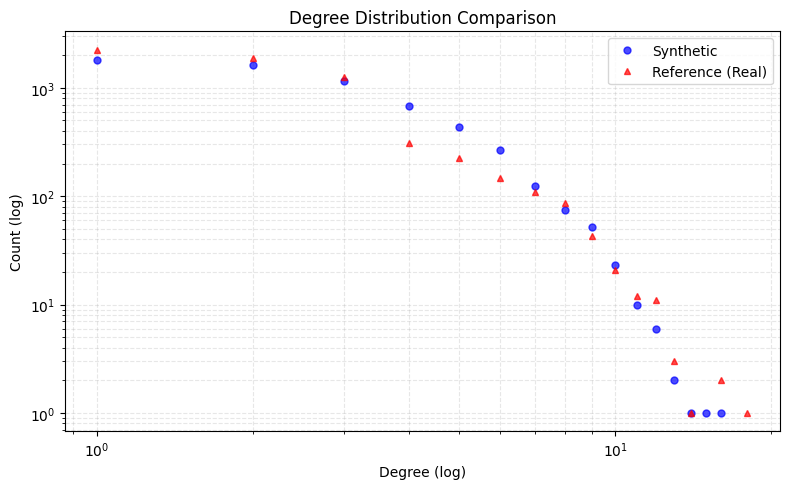

<Figure size 640x480 with 0 Axes>

In [ ]:
# Degree distribution comparison
comparator.plot_degree_comparison(log_scale=True)

## Run some power flows using pandapower or powsybl

In [13]:
from powergrid_synth import pandapower_to_pypowsybl, nx_to_pandapower
import pandapower as pp

base_kv_list = graph_ref.graph.get("base_kv_map", {0: 110.0})
# Convert synthetic transmission grid to pandapower
net_syn_pp = nx_to_pandapower(graph_syn, base_kv_map=base_kv_list)
print(f"pandapower network: {len(net_syn_pp.bus)} buses, {len(net_syn_pp.line)} lines, "
      f"{len(net_syn_pp.trafo)} trafos")

# Run DC power flow via pandapower
try:
    pp.rundcpp(net_syn_pp)
    print(f"\nDC power flow converged ✓")
    print(f"  Max bus voltage angle: {net_syn_pp.res_bus.va_degree.max():.2f}°")
    print(f"  Min bus voltage angle: {net_syn_pp.res_bus.va_degree.min():.2f}°")
except Exception as e:
    print(f"DC power flow failed: {e}")

pandapower network: 6263 buses, 7697 lines, 1004 trafos

DC power flow converged ✓
  Max bus voltage angle: 0.00°
  Min bus voltage angle: -0.00°


## Run AC using pypowsybl

In [16]:
ppl_net = pandapower_to_pypowsybl(net_syn_pp)
ppl.loadflow.run_ac(ppl_net)

[ComponentResult(connected_component_num=0, synchronous_component_num=0, status=CONVERGED, status_text=Converged, iteration_count=1, reference_bus_id='sub_1_0', slack_bus_results=[SlackBusResult(id='sub_1_0', active_power_mismatch=-9.999999999999999e-05)], distributed_active_power=0.0)]

In [17]:
from pypowsybl_jupyter import network_explorer, nad_explorer, display_nad

Uncomment the following cell and run it on your local computer to interact with the synthetic grid using pypowsybl

In [ ]:
nad_explorer(ppl_net, depth=3)

In [19]:
ppl_net.get_network_area_diagram()

In [21]:
grid.get_network_area_diagram()